## Analyze the relationship between the type ofcuisine and the restaurant's rating.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df=pd.read_csv('engineered_restaurant_dataset.csv')

In [3]:
df[0:2]

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Price range,Aggregate rating,Rating color,Rating text,Votes,avg_cost_for_one,Cuisine Count,Cuisines_Mean_Rating,Cuisines_Mean_Rating_Avg,Price_TableBooking
0,6317637,Le Petit Souffle,162,Makati City,71,"Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"['French', 'Japanese', 'Desserts']",...,3,4.8,5,5,314,3465.0,3,"[3.8620689655172415, 3.7985611510791366, 2.978...",3.546499,3
1,6304287,Izakaya Kikufuji,162,Makati City,67,"Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,['Japanese'],...,3,4.5,5,5,591,3780.0,1,[3.7985611510791366],3.798561,3


In [4]:
pd.set_option('display.max_rows', None)

In [5]:
df.groupby('Cuisines')['Aggregate rating'].mean()

Cuisines
['Afghani', 'Mughlai', 'Chinese']                                                                                  3.297381
['Afghani', 'North Indian', 'Pakistani', 'Arabian']                                                                3.297381
['Afghani', 'North Indian']                                                                                        3.330674
['Afghani']                                                                                                        3.214682
['African', 'Portuguese']                                                                                          4.200000
['African']                                                                                                        4.700000
['American', 'Asian', 'Burger']                                                                                    4.600000
['American', 'Asian', 'European', 'Seafood']                                                                       4.600000

In [6]:
import ast
df['Cuisines'] = df['Cuisines'].apply(lambda x: 
                                       ast.literal_eval(x) # Convert string to a Python object if it's a valid literal
                                       if isinstance(x, str) # Only do this conversion if x is a string
                                       else x)

In [7]:
def fetch_first_element(row):
    return row[0] if isinstance(row,list) and len(row)>0 else None

In [8]:
df['Top_cuisines']=df['Cuisines'].apply(fetch_first_element)

In [9]:
new_df=df.groupby('Top_cuisines')['Aggregate rating'].mean()

In [10]:
new_df = new_df.reset_index()
new_df.columns = ['Top Cuisines', 'Average Rating']

In [11]:
new_df=new_df.sort_values(by='Average Rating',ascending=False)

In [12]:
new_df

,Top Cuisines,Average Rating
106,Sunda,4.900000
96,Scottish,4.700000
24,Cajun,4.700000
108,Taiwanese,4.650000
37,Filipino,4.616667
85,Persian,4.600000
91,Ramen,4.600000
118,World Cuisine,4.500000
5,Argentine,4.500000
46,Hawaiian,4.480000


In [13]:
import plotly.express as px
plt.figure(figsize=(50, 8))
# Create a bar plot with Plotly


fig = px.bar(new_df, x='Top Cuisines', y='Average Rating')

fig.update_traces(text=new_df['Average Rating'],
                  textposition='outside')
# Update layout for better readability
fig.update_layout(
    title='Average Rating by Cuisine',
    xaxis_title='Top Cuisines',
    yaxis_title='Average Rating',
    xaxis_tickangle=-45,
    height=600,
    width=5000
)

# Show the interactive plot
fig.show()


<Figure size 5000x800 with 0 Axes>

### this is analysis of cuisines with it's average rating 

### Task 2 : Identify the most popular cuisines among customers based on the number of votes.

In [14]:
top_cuisines_votes=df.sort_values(by='Votes', ascending=False)[['Votes','Top_cuisines']][0:50]
top_cuisines_votes

,Votes,Top_cuisines
728,10934,Italian
735,9667,American
3994,7931,Continental
2412,7574,Continental
739,6907,European
2414,5966,North Indian
743,5705,Finger Food
2307,5434,European
736,5385,North Indian
2411,5288,Chinese


### This is top 50 cuisines preferred by customers based on votes

In [15]:
import seaborn as sns
import plotly.express as px
fig = px.bar(top_cuisines_votes.sort_values(by='Votes', ascending=False), 
             x='Top_cuisines', 
             y='Votes',
             title='Votes by Top Cuisines',
             labels={'Top_cuisines': 'Top Cuisines', 'Votes': 'Votes'},
             text='Votes')

# Update layout for better readability
fig.update_layout(
    xaxis_title='Top Cuisines',
    yaxis_title='Votes',
    xaxis_tickangle=-45,
    height=600,
    width=1000,
    title_font_size=20
)

# Update the text on the bars to show the exact values
fig.update_traces(texttemplate='%{text:,}', textposition='outside')

# Show the interactive plot
fig.show()


### Italian cuisines has got highest votes then comes american , european north indian


## Task 3 : Data visulization

### Create visualizations to represent the distribution of ratings using different charts (histogram, bar plot, etc.).

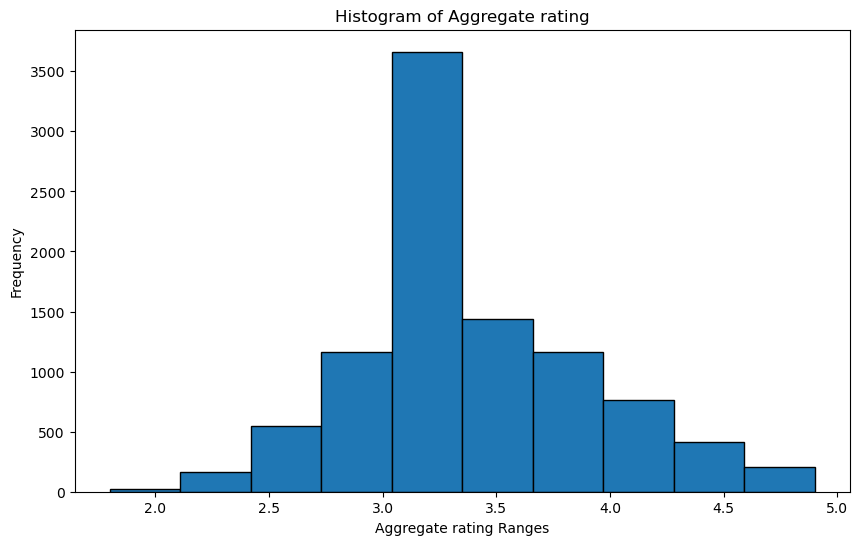

In [16]:
plt.figure(figsize=(10, 6))  # Set the figure size
plt.hist(df['Aggregate rating'], bins=10, edgecolor='black')  # bins define the number of intervals

# Adding titles and labels
plt.title('Histogram of Aggregate rating')
plt.xlabel('Aggregate rating Ranges')
plt.ylabel('Frequency')

# Show the plot
plt.show()

### 3 to 3.5 rating has highest frequency 

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



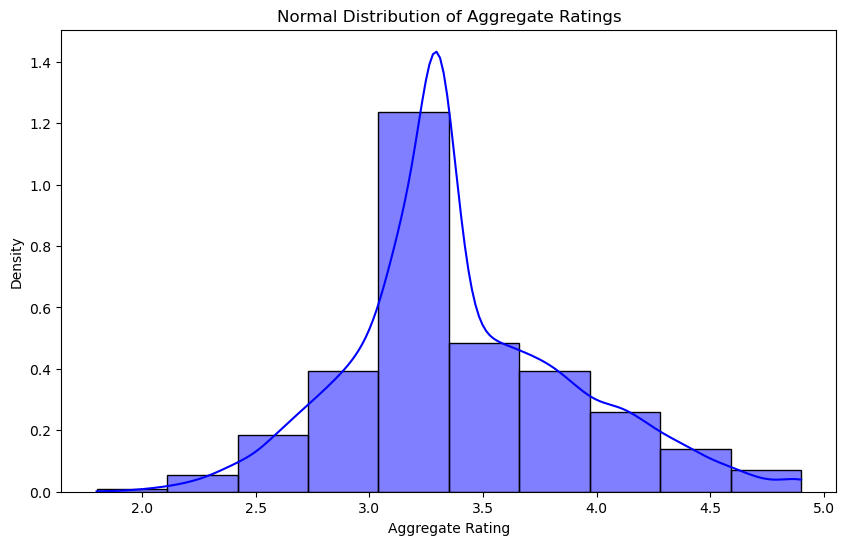

In [17]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate rating'], bins=10, kde=True, stat="density", color='blue', edgecolor='black')

# Adding titles and labels
plt.title('Normal Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Density')

# Show the plot
plt.show()

## Task :  Compare the average ratings of different cuisines or cities using appropriate visualizations.


In [18]:
new_df1=df.groupby('City')['Aggregate rating'].mean()
new_df1 = new_df1.to_frame()
new_df1.reset_index(inplace=True)

In [19]:
new_df1=new_df1.sort_values(by='Aggregate rating',ascending=False)

In [20]:
  
plt.figure(figsize=(15, 10))  
import plotly.express as px
fig = px.bar(new_df1, x='City', y='Aggregate rating', title='Average Rating by City', labels={'City': 'City', 'Aggregate rating': 'Aggregate Rating'})

fig.update_layout(xaxis_title='City', yaxis_title='Aggregate Rating', xaxis_tickangle=-45, height=600, width=3000)

# Show the interactive plot
fig.show()

<Figure size 1500x1000 with 0 Axes>

### Inner city and quezan city have highest rating and mc millan has lowest rating.

### Task - Visualize the relationship between various features and the target variable to gain insights.

In [21]:
import pandas as pd
new_df=pd.read_csv('Dataset .csv')

In [22]:
new_df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,...,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336
6,6300781,Buffet 101,162,Pasay City,"Building K, SM By The Bay, Sunset Boulevard, M...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979667,14.531333,"Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.0,Green,Very Good,520
7,6301290,Vikings,162,Pasay City,"Building B, By The Bay, Seaside Boulevard, Mal...","SM by the Bay, Mall of Asia Complex, Pasay City","SM by the Bay, Mall of Asia Complex, Pasay Cit...",120.979333,14.540000,"Seafood, Filipino, Asian, European",...,Botswana Pula(P),Yes,No,No,No,4,4.2,Green,Very Good,677
8,6300010,Spiral - Sofitel Philippine Plaza Manila,162,Pasay City,"Plaza Level, Sofitel Philippine Plaza Manila, ...","Sofitel Philippine Plaza Manila, Pasay City","Sofitel Philippine Plaza Manila, Pasay City, P...",120.980090,14.552990,"European, Asian, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.9,Dark Green,Excellent,621
9,6314987,Locavore,162,Pasig City,"Brixton Technology Center, 10 Brixton Street, ...",Kapitolyo,"Kapitolyo, Pasig City",121.056532,14.572041,Filipino,...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,532


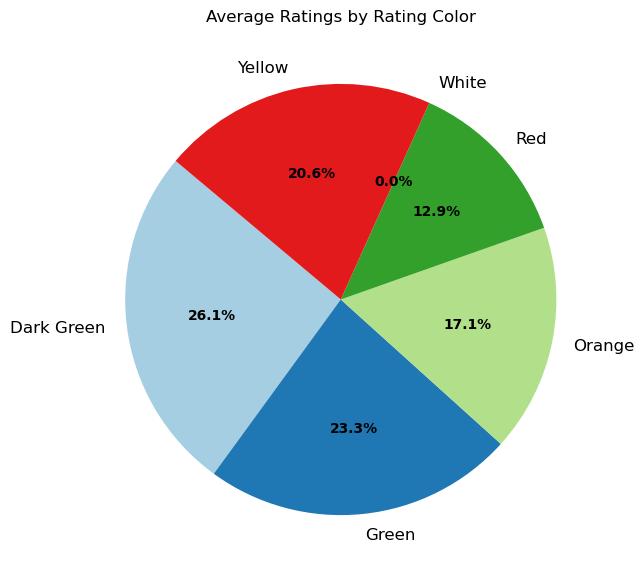

In [23]:
avg_ratings = new_df.groupby('Rating color')['Aggregate rating'].mean()

# Plot the pie chart
plt.figure(figsize=(10, 7))
wedges, texts, autotexts = plt.pie(
    avg_ratings, 
    labels=avg_ratings.index, 
    autopct='%1.1f%%',  # Display percentages on the pie chart
    startangle=140,    # Start angle for the pie chart
    colors=plt.cm.Paired(range(len(avg_ratings)))  # Optional: color map for aesthetics
)

# Improve readability
plt.setp(autotexts, size=10, weight="bold")  # Style for the percentage labels
plt.setp(texts, size=12)  # Style for the category labels

# Add title
plt.title('Average Ratings by Rating Color')

# Show the plot
plt.show()

Text(0, 0.5, 'Average Rating')

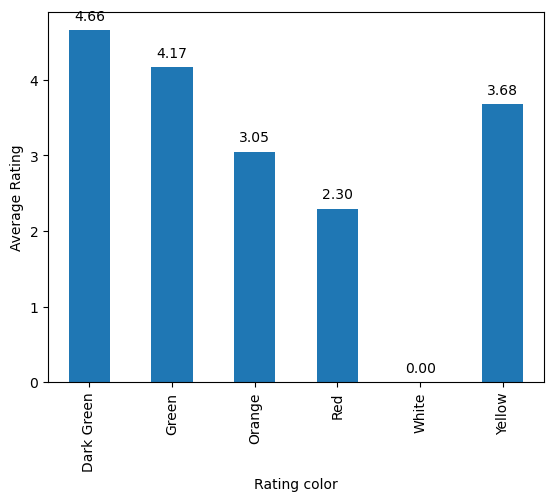

In [24]:
ax = new_df.groupby('Rating color')['Aggregate rating'].mean().plot(kind='bar')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), 
                textcoords='offset points')
plt.ylabel('Average Rating')

### dark green shows highest rating and red almost low

Text(0.5, 1.0, 'Average Aggregate Rating by price range')

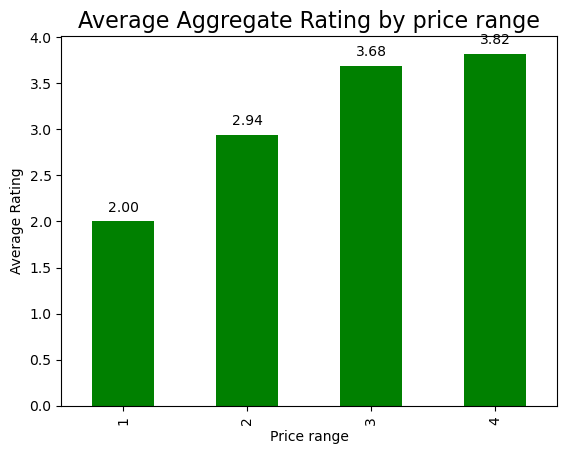

In [30]:
ax = new_df.groupby('Price range')['Aggregate rating'].mean().plot(kind='bar',color='green')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), 
                textcoords='offset points')
plt.ylabel('Average Rating')
ax.set_title('Average Aggregate Rating by price range', fontsize=16)

### when price range increses then also average rating of resturant also increses , highest price range got highest rating.

Text(0.5, 1.0, 'Average Aggregate Rating by Rating Text')

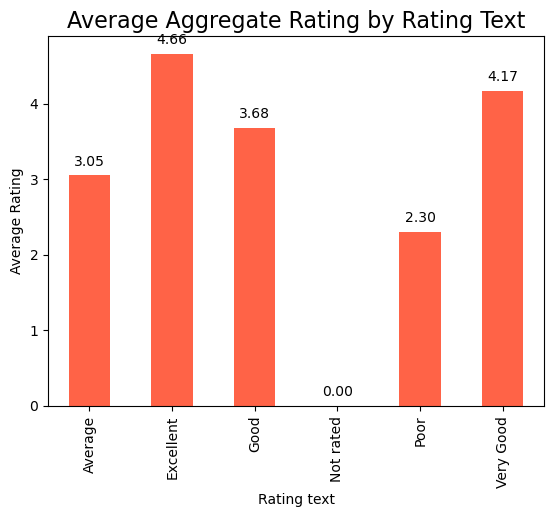

In [29]:
ax = new_df.groupby('Rating text')['Aggregate rating'].mean().plot(kind='bar',color='#ff6347')

for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), 
                textcoords='offset points')
plt.ylabel('Average Rating')
ax.set_title('Average Aggregate Rating by Rating Text', fontsize=16)

### excellent category got highest rating 

<Axes: xlabel='Aggregate rating', ylabel='Votes'>

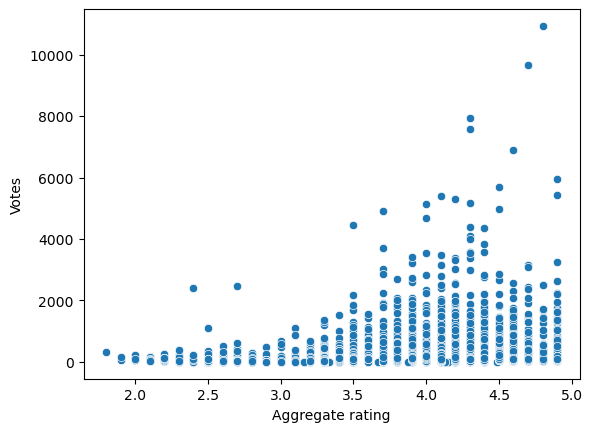

In [34]:
## plot scatter plot votes vs rating
sns.scatterplot(df,x='Aggregate rating',y='Votes')


### Aggregate rating  increased then also number of votes increases 
### highest number votes gets highest rating

<Axes: xlabel='avg_cost_for_one', ylabel='Aggregate rating'>

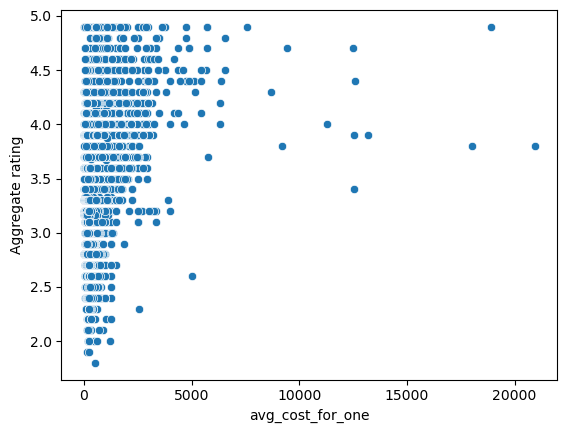

In [38]:
sns.scatterplot(df,x='avg_cost_for_one',y='Aggregate rating')

### there is no correlation between rating and avg_cost_for_one . some of resturant have highest cost then rating also increses.